In [1]:
using Plots
using LaTeXStrings
include("fft.jl")
# using FFTW
# function fft2(image)
#     return fftshift(fft(ifftshift(image)))
# end

ifft2 (generic function with 1 method)

In [2]:
function fftfreq(n::Int, d::Real=1)
    val = 1.0 / (n * d)
    N = div(n, 2)
    if iseven(n)
        return vcat(0:N-1, -N:-1) * val
    else
        return vcat(0:N, -(N): -1) * val
    end
end

fftfreq (generic function with 2 methods)

In [3]:
function Wavelength(E::T) where T <: Real
    hc::T = 12.398 #keV*Angstrom
    # h = 6.582119e-16 #eV*sec
    # mc2 = 511 #keV
    E₀::T = 511.0 #keV
    return hc/sqrt(abs(E*(2*E₀ + E)))
end


function Focus(E::T, Cs::T, nᵢ=1)::T where T <: Real
    return sqrt((2*nᵢ-0.5)*Cs*Wavelength(E))
end
kmax(E, Cs) = (6/((Cs*Wavelength(E)^3)))^(1/4)

Diff_Image(image, c=0.1) = @. log1p(c*abs(image))

Diff_Image (generic function with 2 methods)

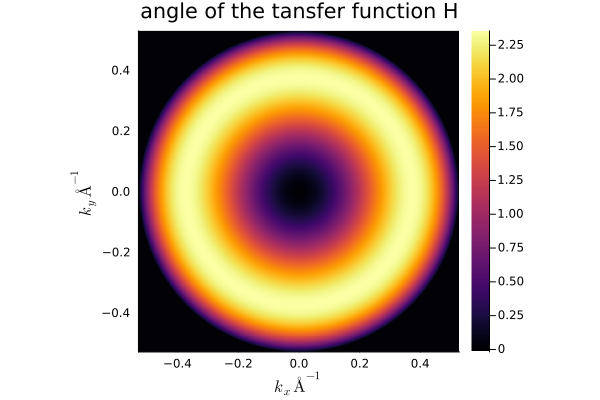

In [4]:
E = 300.0 #keV
Cs = 1 #mm
Cs = Cs * 1e7 #convert to Angstroms

N = 2^10
physical_scale = 1
camera_scale = 2

upper = (N-1)/2 + 0.1
lower = (-N+1)/2
kx = collect(lower:1:upper)
ky = collect(lower:1:upper)

r = @. sqrt(kx'^2 + ky^2)
disk_scale = 1
disk = r.<=N/2/disk_scale

kx = kx./maximum(kx).*kmax(E, Cs).*disk_scale
ky = ky./maximum(ky).*kmax(E, Cs).*disk_scale
k = @. sqrt(kx'^2 + ky^2)


Δk = kx[2] - kx[1]
L = 1/Δk
ΔL = L/N

x = collect(range(-L/2, L/2, N))
y = collect(range(-L/2, L/2, N))
r_dist = @. sqrt(x'^2 + y^2)


λ(E) = Wavelength(E)
Δf(E, Cs) = Focus(E, Cs)
χ(k) = @. π*λ(E)*k^2*(0.5*Cs*λ(E)^2*k^2 - Δf(E, Cs))

H = @. exp(-1im*χ(k)*disk)*disk
# H = disk
# H = abs.(fft(fft(disk)))
# H = fill(1.0, N, N)

heatmap(kx, ky, angle.(H), title="angle of the tansfer function H",  
        xlabel=L"k_x\, Å^{-1}", ylabel=L"k_y\, Å^{-1}", aspect_ratio=1)
xlims!(kx[1], kx[end])
ylims!(ky[1], ky[end])

\begin{align*}
    u, v \to \frac{x}{\lambda  f}, \frac{y}{\lambda  f}, 
\end{align*}

In [5]:
σ(E) = 2π/(Wavelength(E)*E) * (511 + E)/(2*511 + E)
"""
lets estimate n and κ from CjW thesis. Lets assume there is a 10 phase_reconstruced
decay and pi/2 phase shift after 50nm
"""
λ_nm = Wavelength(E)/10 # convert to nm
#given
σU = 0.15 
α = 0.008 
distance_est = 50 #nm
κ = α * (λ_nm/(2*π)) # this is the attenuation coefficient 


"""
Assuming that CJW uses 300keV electrons
"""
σ_cjw = σ(300.0) * 10 # per nm 
U_mip = σU/σ_cjw 
println(κ,"  ", U_mip)
# κ = 0

2.5066020800003746e-6  0.022983624805675437


0.5345070897319689


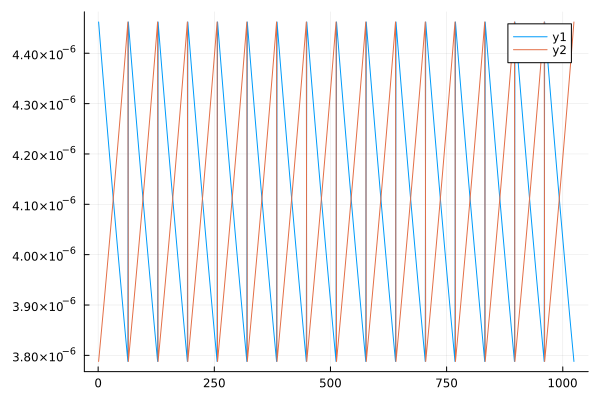

In [104]:
function blazed_2dgrating(p; thickness=500, mill_depth=208)
    """
        thickness = 500 #Angstroms
        mill_depth = 208 #Angstroms
    """

    xs = (0:N-1) ./ N                # N points, endpoint 1 is excluded
    d0 = thickness - mill_depth
    g1 = @. mill_depth*mod(p*xs, 1) + d0
    # idx = 0:N-1
    # g1  = mill_depth .* (idx .% (N ÷ p)) ./ (N ÷ p) .+ d0
    g2 = repeat(g1', N, 1)
    return g2
end

periods = 16*disk_scale
ψ_grating = @. cis((σ(E)*U_mip+1im*κ*2π/Wavelength(E))*$blazed_2dgrating(periods)*disk) * disk;

"""
    I believe that my kappa and U_mip values are wrong since using just the values reported in CJW, the results are very different
"""
x = collect(range(-10e4, 10e4, N))
y = copy(x)
ΔL = x[2] - x[1]
ψ_grating = @. cis((σU + 1im * α)*$blazed_2dgrating(periods)/10 * disk) * disk
# ψ_grating = @. cis((σU + 1im * α)*$blazed_2dgrating(periods)/10 ) 

# ψ_grating = @. cis((σU )*$blazed_2dgrating(periods)/10 ) 
ψ_grating /= sqrt(sum(abs2,disk) * ΔL^2)
println(sum(abs2,ψ_grating)*ΔL^2);
plot(abs.(ψ_grating[N÷2+1,:]))
plot!(abs.(reverse(ψ_grating[N÷2+1,:])))


In [7]:
function zoom_in(image::AbstractMatrix, width = 50)
    N = size(image, 1)
    center = div(N, 2) + 1
    half_width = div(width, 2)
    return image[center-half_width:center+half_width, center-half_width:center+half_width]
end

function zoom_in(x::AbstractVector, y::AbstractVector, image::AbstractMatrix, width = 50)
    N = size(image, 1)
    center = div(N, 2) + 1
    half_width = div(width, 2)
    x_zoomed = x[center-half_width:center+half_width]
    y_zoomed = y[center-half_width:center+half_width]
    # , xlims=(x_zoomed[1], x_zoomed[end]), ylims=(y_zoomed[1], y_zoomed[end])
    return x_zoomed, y_zoomed, image[center-half_width:center+half_width, center-half_width:center+half_width]

end

function zoom_heatmap(x::AbstractVector, y::AbstractVector, image::AbstractMatrix, width=50; kwargs...)
    N = size(image, 1)
    center = div(N, 2) + 1
    half_width = div(width, 2)
    
    x_zoomed = x[center-half_width:center+half_width]
    y_zoomed = y[center-half_width:center+half_width]
    image_zoomed = image[center-half_width:center+half_width, center-half_width:center+half_width]
    
    return heatmap(x_zoomed, y_zoomed, image_zoomed; xlims=(x_zoomed[1], x_zoomed[end]), ylims=(y_zoomed[1],y_zoomed[end]), kwargs...)
end
function zoom_in(x::AbstractVector, y::AbstractVector, width = 20)
    N = length(y)
    ctr = N÷2 + 1
    half_width = width ÷ 2
    x_zoomed = x[ctr-half_width:ctr+half_width]
    y_zoomed = y[ctr-half_width:ctr+half_width]
    return x_zoomed, y_zoomed
end

function transform_coordinates(x, y, E, f)
    """
    transform x and y coordinates from front focal plane to back focal plane. it assumes that
    the ff-plane coordinates and focal point are in units of Angstroms. E is units of keV.
    """
    ΔLx, ΔLy = x[2] - x[1], y[2] - y[1]
    Nx, Ny = length(x), length(y)
    kx, ky = fftshift(fftfreq(Nx, ΔLx)), fftshift(fftfreq(Ny, ΔLy))
    kx_transformed = @. kx * Wavelength(E) * f
    ky_transformed = @. ky * Wavelength(E) * f
    return kx_transformed, ky_transformed
end
function chain_transforms(x0, y0, focal_lengths, E)
    coords = []
    x, y = x0, y0
    push!(coords, (x, y))
    for f in focal_lengths
        x, y = transform_coordinates(x, y, E, f)
        push!(coords, (x, y))
    end
    return coords
end

chain_transforms (generic function with 1 method)

In [88]:
function radial_grid(x,y)
    Nx, Ny = length(y), length(x)

    upperx = (Nx-1)/2 + 0.1
    lowerx = (-Nx+1)/2
    rx = collect(lowerx:1:upperx)

    uppery = (Ny-1)/2 + 0.1
    lowery = (-Ny+1)/2
    ry = collect(lowery:1:uppery)

    return @. sqrt(rx'^2 + ry^2)
end

function radial_disks(coords, disk_rel_scales)
    r_dists = [(@. sqrt(x'^2 + y^2)) for (x,y) in coords[1:3]]
    r_ratios = [maximum(r_dist)/maximum(r_dists[1]) for r_dist in r_dists]
    
    r = radial_grid(coords[1]...)
    disks = [r.<=N/2/ratio * disk_rel_scales[i] for (i,ratio) in enumerate(r_ratios)]
    return disks, r_dists
end


function double_grating(x1, y1, ψ_1stgrating, ψ_2ndgrating; aberrations=false, focal_lengths::Vector)
    """
        This function will propagate a plane wave incident on g1 into plane_1, interact with the sample, 
        propagate again into plane_2, interact with g2, and finally propagate again into plane_3 (image plane).

        There are 3 total propagations.
    """
    crds = chain_transforms(x1, y1, focal_lengths, E)
    dx2 = [(x[2] - x[1]) * (y[2] - y[1]) for (x,y) in crds]

    disk_rel_scales = [1, 5, 1]
    disks, r_dists = radial_disks(crds, disk_rel_scales)

    
    H = [aberrations ? (@. exp(-1im*χ(r_dists[i]/(f*λ(E)))*disks[i])*disks[i]) : ones(N,N) for (i,f) in enumerate(focal_lengths)]

    
    ψ_1stgrating = @. cis((σU + 1im * α)*$blazed_2dgrating(periods)/10 * disks[1]) * disks[1]
    ψ_1stgrating /= sqrt(sum(abs2, ψ_1stgrating) * dx2[1])
    ψ_2ndgrating = @. cis((σU + 1im * α)*$blazed_2dgrating(periods*focal_lengths[2]/focal_lengths[1])/10 * disks[3]) * disks[3]
    ψ_2ndgrating /= sqrt(sum(abs2, disks[3]) * dx2[3])
    println(sqrt(sum(abs2, ψ_2ndgrating) * dx2[3]))
    
    ψ_1m = ones(N, N) 
    ψ_1p = ψ_1stgrating.*H[1]
    ψ_1p ./= sqrt(sum(abs2, ψ_1p) * dx2[1])

    ψ_2m = fft2(ψ_1p)*dx2[1] /(1im * Wavelength(E) * focal_lengths[1]);
    ψ_2p = copy(ψ_2m) 

    ψ_3m = ifft2(ψ_2p.*H[2])*dx2[2] /(1im * Wavelength(E) * focal_lengths[2]) * reduce(*, size(ψ_2p));
    ψ_3m = reverse(ψ_3m)
    ψ_probability = (sum(abs2, ψ_3m.*disks[3]) * dx2[3]) * (sum(abs2, ψ_2ndgrating.*disks[3]) * dx2[3])
    ψ_3p = ψ_3m .* ψ_2ndgrating
    ψ_3p .*= sqrt(ψ_probability/(sum(abs2, ψ_3p) * dx2[3]))

    
    ψ_4m = fft2(ψ_3p.*H[3])*dx2[3] /(1im * Wavelength(E) * focal_lengths[3]);
    ψs = [ψ_1p, ψ_2m, ψ_2p, ψ_3m, ψ_3p, ψ_4m]
    idx = [1, 2, 2, 3, 3, 4]
    probs = [sum(abs2, ψ) * dx2[idx[i]] for (i,ψ) in enumerate(ψs)]
    return ψs, probs, H
end

double_grating (generic function with 1 method)

In [89]:


crds = chain_transforms(x, y, focal_lengths, E)
disk_rel_scales = [1, 2, 1]
disks, r_dists = radial_disks(crds, disk_rel_scales)
dx2 = [(x[2] - x[1]) * (y[2] - y[1]) for (x,y) in crds]




4-element Vector{Float64}:
  38221.58774386443
 967034.3857593507
  38221.58774386443
 967034.3857593507

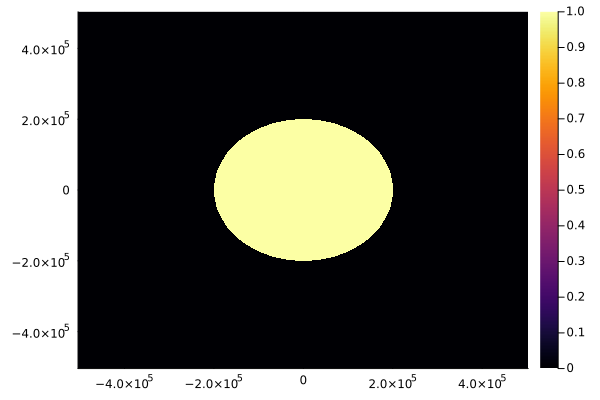

In [90]:
idx = 2
heatmap(crds[idx]...,abs.(disks[idx]))

In [92]:
aberrations = true
focal_lengths = [1e10, 1e10, 1e10] # in Angstroms

ψ_test, probs, Hs = double_grating(x, y, ψ_grating, ψ_grating; aberrations=true, focal_lengths=focal_lengths);
println(probs)


0.731099279685567
[1.0, 1.0000000000000369, 1.0000000000000369, 0.9996325814413596, 0.5333428087892172, 0.5333428087892376]


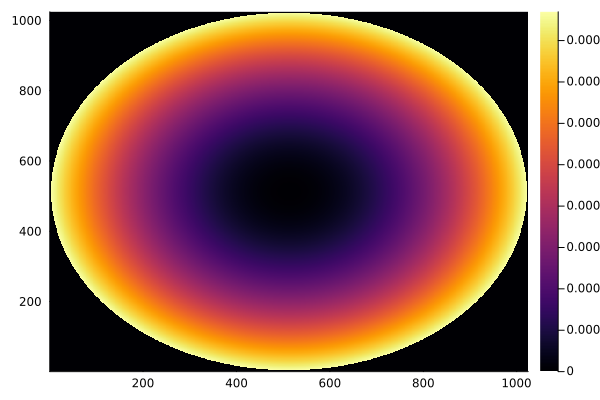

In [103]:
idx = 2
heatmap((angle.(Hs[idx])))

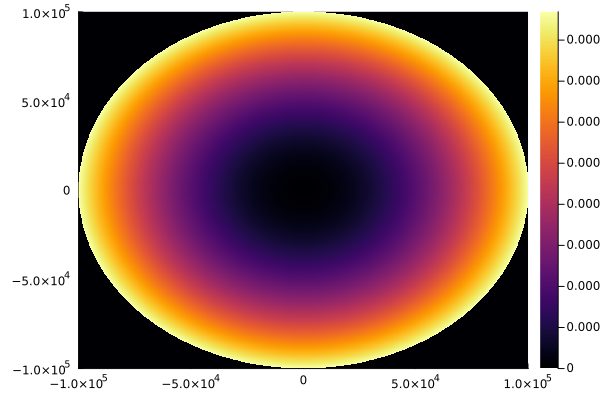

In [95]:
idx = 1
heatmap(crds[idx]...,angle.(Hs[idx]))

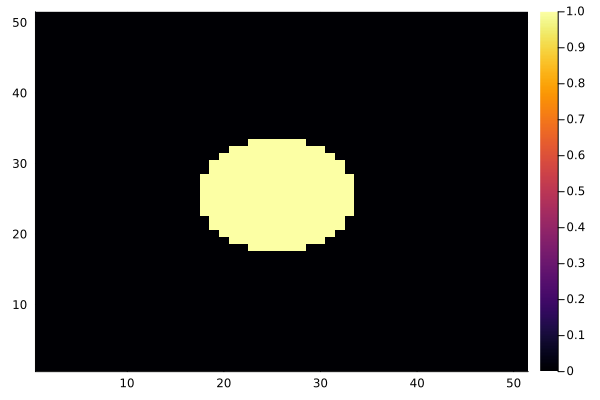

In [96]:
focal_1 = 1e10
focal_2 = 1e10
focal_3 = 1e10

ψ_0p = @. ψ_grating .* H
ψ_0p ./= sqrt(sum(abs2, ψ_0p) * ΔL^2)
ψ_1m = fft2(ψ_0p)*ΔL^2 /(1im * Wavelength(E) * focal_1);
ψ_material = @. cis((x/maximum(x)*π) * (x>0) * disk[N÷2+1,:])
ψ_material = repeat(ψ_material',N,1)
mask = @. sqrt(x'^2 + y^2) < 8 * ΔL
ψ_1p = @. ψ_1m * ψ_material;
ψ_1p = @. ψ_1m * cis(mask*3π/2);
ψ_1p = copy(ψ_1m);
heatmap(zoom_in(mask, 50))

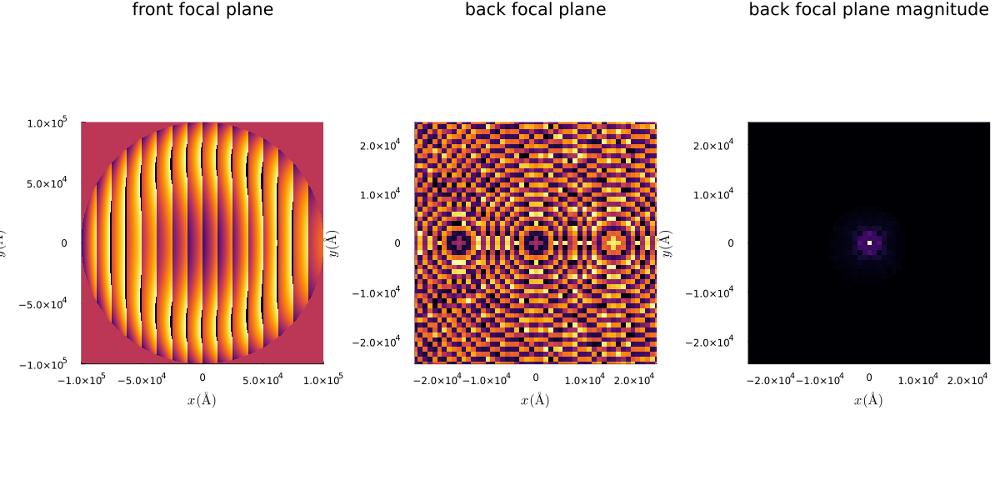

In [97]:
x_1, y_1 = transform_coordinates(x, y, E, focal_1)

fig1 = heatmap(x,y,angle.(ψ_0p), title="front focal plane", 
        xlabel=L"x\, (Å)", ylabel=L"y\, (Å)", aspect_ratio=1, colorbar=false, xlims=(x[1],x[end]),ylims=(y[1],y[end]))

fig2 = zoom_heatmap(x_1, y_1, angle.(ψ_1m), 50, 
                   title="back focal plane", 
                   xlabel=L"x\, (Å)", ylabel=L"y\, (Å)", 
                   aspect_ratio=1, colorbar=false)

fig3 = zoom_heatmap(x_1, y_1, abs.(ψ_1m.*mask), 50,
                   title="back focal plane magnitude", 
                   xlabel=L"x\, (Å)", ylabel=L"y\, (Å)", 
                   aspect_ratio=1, colorbar=false)
plot(fig1, fig2, fig3, layout=(1, 3), size=(1200, 600))

\begin{align*}
    \int f(x,y) dx^2 \approx \sum_{i,j} f(x_i,y_j) \Delta x \Delta y
\end{align*}

1.0
1.0000000000000318
0.999872804996095
0.5345070897319689
3.3896257044322945e-6


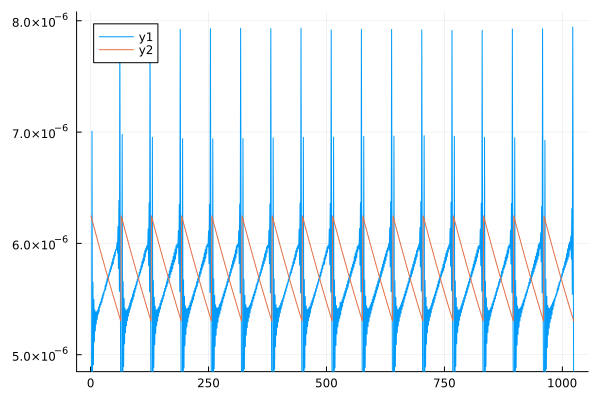

In [98]:
ΔL_1 = x_1[2] - x_1[1]
println(sum(abs2, ψ_0p)*(ΔL^2))
println(sum(abs2, ψ_1m)*(ΔL_1^2))

x_2, y_2 = transform_coordinates(x_1, y_1, E, focal_2)
ΔL_2 = x_2[2] - x_2[1]

ψ_2m = @. $fft2(ψ_1p*H)*ΔL_1^2/(1im * Wavelength(E) * focal_2) 
ψ_2m = circshift(ψ_2m, (-1,-1))
println(sum(abs2, ψ_2m)*ΔL_2^2)
println(sum(abs2, ψ_grating) * ΔL^2)
println(minimum(abs, ψ_2m[N÷2+1,:]))
plot(abs.(ψ_2m[N÷2+1,:]))
plot!(abs.(ψ_grating[N÷2+1,:]).*1.4)
ymin,ymax = ylims()
ylims!(ymax*0.6, ymax)  # or use a specific upper value

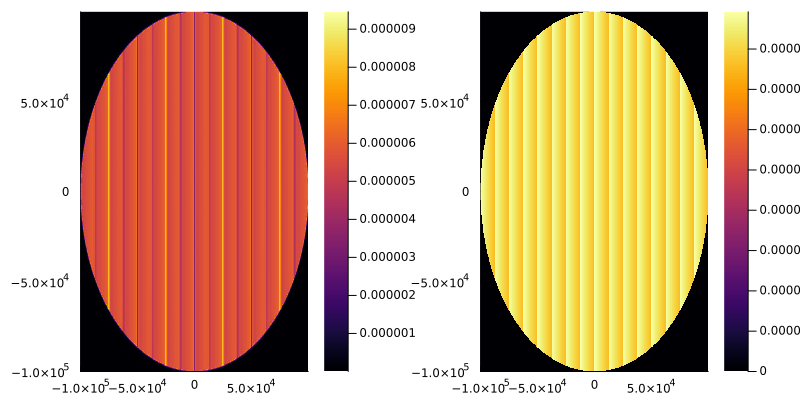

In [99]:
G = focal_2/focal_1
disk_2 = r.<=N/2/G
ψ_2grating = @. cis((σU + 1im * α)*$blazed_2dgrating(periods*G)/10 * disk_2) * disk_2
ψ_2grating /= sqrt(sum(abs2,disk_2) * ΔL_2^2)


fig1 = heatmap(x_2,y_2,abs.(ψ_2m))
fig2 = heatmap(x_2, y_2, abs.(ψ_2grating))
plot(fig1, fig2, layout=(1,2), size=(800,400))

0.5337387820267799 0.999872804996095
0.53373878202678


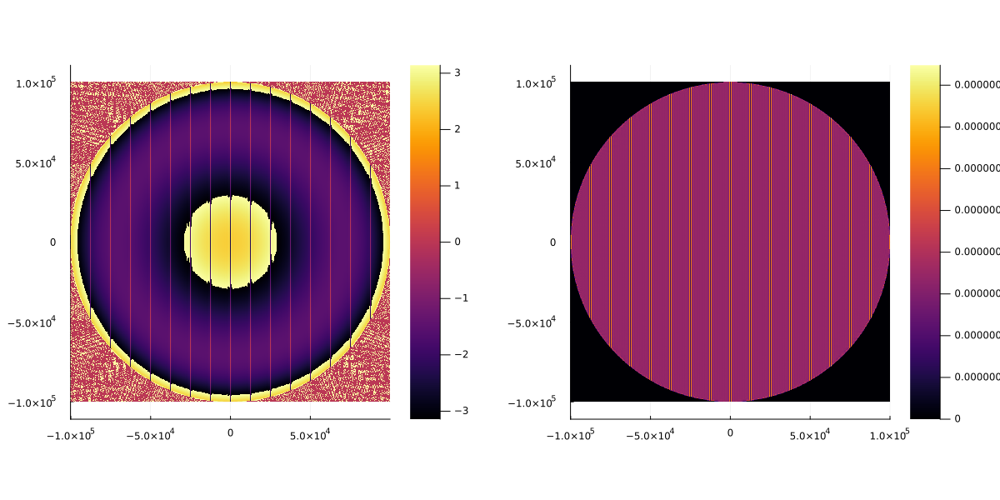

In [100]:


ψ_2probability = (sum(abs2, ψ_2m.*disk_2) * ΔL_2^2) * (sum(abs2, ψ_2grating) * ΔL_2^2)
println(ψ_2probability, " ", sum(abs2, ψ_2m) * ΔL_2^2)

ψ_2p = ψ_2m .* ψ_2grating
ψ_2p .*= sqrt(ψ_2probability/(sum(abs2, ψ_2p) * ΔL_2^2))
println(sum(abs2, ψ_2p)*ΔL_2^2)

fig1 = heatmap(x_2,y_2,angle.(ψ_2p), aspect_ratio=:equal)
fig2 = heatmap(x,y, abs2.(ψ_2p), aspect_ratio=:equal)
plot(fig1, fig2, layout=(1,2), size = (1200,600))

0.5337387820267919


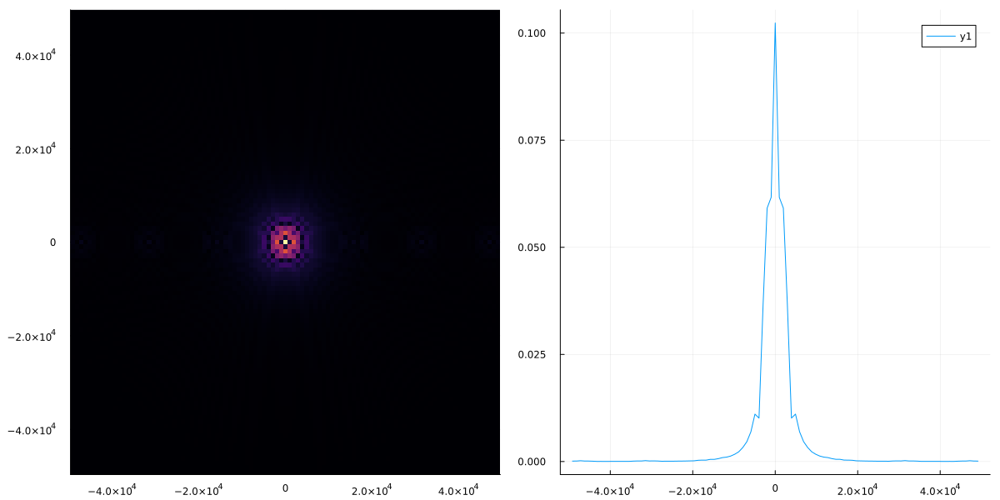

In [101]:
x_3, y_3 = transform_coordinates(x_2, y_2, E, focal_3)
ΔL_3 = x_3[2] - x_3[1]

ψ_3m = @. $fft2(ψ_2p*H)*ΔL_2^2/(1im * Wavelength(E) * focal_3); 
println(sum(abs2, ψ_3m)*ΔL_3^2)

# ψ_original = copy(ψ_3m)
# ψ_pi = copy(ψ_3m)
# ψ_pi2 = copy(ψ_3m)
# ψ_3pi2 = copy(ψ_3m)

fig1 = heatmap(zoom_in(x_3,y_3,Diff_Image(ψ_3m,0.01), 100), colorbar=false)
fig2 = plot(zoom_in(x_3, vec(sum(abs2, ψ_3m.*ΔL_3, dims=1)), 100)...)
# fig2 = plot(zoom_in(x_3, vec(sum(abs2, ψ_original.*ΔL_3, dims=1)), 80)..., label=L"0", color=:black, lw=2)
# plot!(zoom_in(x_3, vec(sum(abs2, ψ_pi2.*ΔL_3, dims=1)), 80)..., label=L"\frac{\pi}{2}", lw=2)
# plot!(zoom_in(x_3, vec(sum(abs2, ψ_pi.*ΔL_3, dims=1)), 80)..., label=L"\pi",lw=2)
# plot!(zoom_in(x_3, vec(sum(abs2, ψ_3pi2.*ΔL_3, dims=1)), 80)..., label=L"\frac{3\pi}{2}",lw=2)


plot(fig1, fig2, layout=(1,2), size = (1200, 600))

In [102]:
sum(abs2, ψ_3m, dims=1)

1×1024 Matrix{Float64}:
 5.01031e-12  2.99683e-12  2.25223e-12  …  2.82399e-12  3.36896e-12